In [0]:
# Install the OpenSlide C library and Python bindings
!apt-get install openslide-tools
!pip install openslide-python


Reading package lists... Done
Building dependency tree       
Reading state information... Done
openslide-tools is already the newest version (3.4.1+dfsg-2).
The following package was automatically installed and is no longer required:
  libnvidia-common-430
Use 'apt autoremove' to remove it.
0 upgraded, 0 newly installed, 0 to remove and 7 not upgraded.


In [0]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
from openslide import open_slide, __library_version__ as openslide_version
import os
from PIL import Image
from skimage.color import rgb2gray

In [0]:
# See https://openslide.org/api/python/#openslide.OpenSlide.read_region
# Note: x,y coords are with respect to level 0.
# There is an example below of working with coordinates
# with respect to a higher zoom level.

# Read a region from the slide
# Return a numpy RBG array
def read_slide(slide, x, y, level, width, height, as_float=False):
    im = slide.read_region((x,y), level, (width, height))
    im = im.convert('RGB') # drop the alpha channel
    if as_float:
        im = np.asarray(im, dtype=np.float32)
    else:
        im = np.asarray(im)
    assert im.shape == (height, width, 3)

    
    return im

# As mentioned in class, we can improve efficiency by ignoring non-tissue areas 
# of the slide. We'll find these by looking for all gray regions.
def find_tissue_pixels(image, intensity=0.8):
    print("image shape: ", image.shape)
    im_gray = rgb2gray(image)
    assert im_gray.shape == (image.shape[0], image.shape[1])
    indices = np.where(im_gray <= intensity)
    # left = min(indices[0])
    # right = max(indices[0])
    # up = max(indices[1])
    # down = min(indices[1])

    # Adding
    fig, axes = plt.subplots(2, 1, figsize=(16,16))
    axes[0].set_title('Heatmap before')
    axes[0].imshow(image)
    axes[1].set_title('Heatmap after')
    axes[1].imshow(im_gray <= intensity)
    plt.show()
    
    return list(zip(indices[0], indices[1]))

# tissue_pixels, up, down, left, right = find_tissue_pixels(slide_image)
# percent_tissue = len(tissue_pixels) / float(slide_image.shape[0] * slide_image.shape[0]) * 100
# print ("%d tissue_pixels pixels (%.1f percent of the image)" % (len(tissue_pixels), percent_tissue)) 

# print(left, right, down, up)
# img = slide_image[left:right, down:up].copy()
# plt.imshow(img)
# print(img.shape)

def find_tissue_pixels1(image, intensity=0.8):
    # print("image shape: ", image.shape)
    im_gray = rgb2gray(image)
    assert im_gray.shape == (image.shape[0], image.shape[1])
    indices = np.where(im_gray <= intensity)
    # plt.title('Heatmap after')
    # plt.imshow(im_gray <= intensity)
    # plt.show
    # print(len(indices))
    percent_tissue = len(indices[0]) / float(image.shape[0] * image.shape[0]) * 100
    if percent_tissue >= 0.3:
      return True
    else:
      return False


def find_cancer_pixels(image):
    indices = np.where(image>0)
    # print(len(indices[0]))
    # percent_cancer = len(indices[0]) / float(image.shape[0] * image.shape[0]) * 100
    if len(indices[0]) > 0:
      return True
    else:
      return False

In [0]:
index_list = ['064', '075', '078', '081', '084', '091', '094', '096', '101', '110']
# 剩下的从57开始
# index_list = ['001', '002', '005', '012', '016', '019', '023', '031', '035', '057', '059', '064', '075', '078', '081', '084', '091', '094', '096', '101', '110']
# len(index_list)

In [0]:
ll = 2

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 1569M  100 1569M    0     0  99.7M      0  0:00:15  0:00:15 --:--:--  103M
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 94.3M  100 94.3M    0     0  19.3M      0  0:00:04  0:00:04 --:--:-- 20.5M
Read WSI from tumor_064.tif with width: 97792, height: 220672
Read tumor mask from tumor_064_mask.tif
Slide includes 10 levels
Mask include 9 levels
Level 0, dimensions: (97792, 220672) downsample factor 1
Level 1, dimensions: (48896, 110336) downsample factor 2
Level 2, dimensions: (24448, 55168) downsample factor 4
Level 3, dimensions: (12224, 27584) downsample factor 8
Level 4, dimensions: (6112, 13792) downsample factor 16
Level 5, dimensions: (3056, 6896) downsample factor 32
Level 6, dimensions: (1528, 3448) downsa

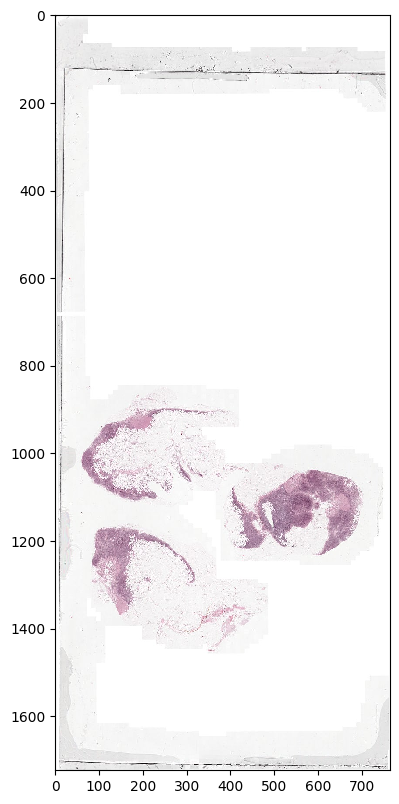

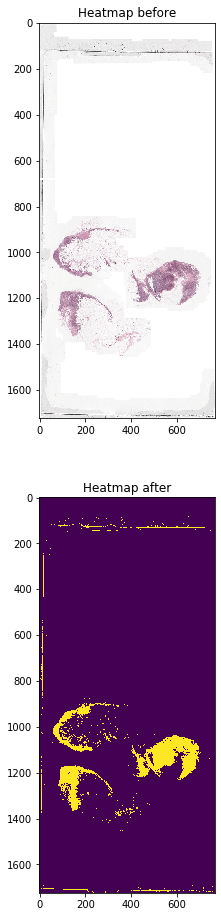

65796 tissue_pixels pixels (2.2 percent of the image)
(1724, 764)


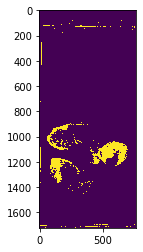

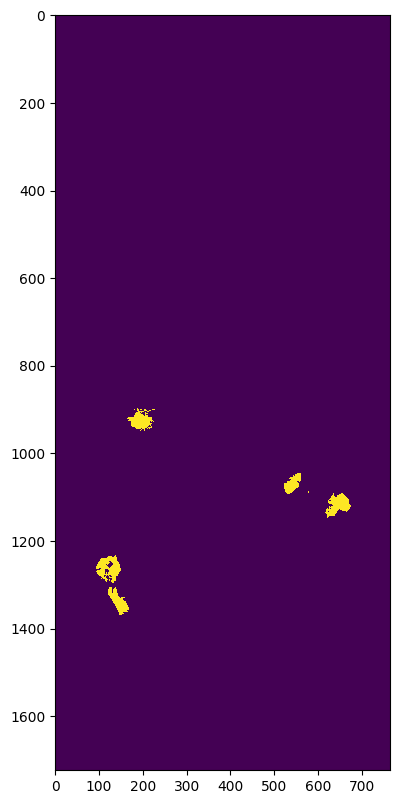

Successfully saved dt064 dir!
Successfully saved 064id_ma.npy file!
Saved zip file successfully!
successfully remove dt064 dir!
successfully remove tumor_064.tif file!
successfully remove tumor_064_mask.tif file!
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  893M  100  893M    0     0  67.9M      0  0:00:13  0:00:13 --:--:-- 75.4M
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 31.4M  100 31.4M    0     0  40.7M      0 --:--:-- --:--:-- --:--:-- 40.7M
Read WSI from tumor_075.tif with width: 90112, height: 78848
Read tumor mask from tumor_075_mask.tif
Slide includes 9 levels
Mask include 9 levels
Level 0, dimensions: (90112, 78848) downsample factor 1
Level 1, dimensions: (45056, 39424) downsample factor 2
Level 2, dimensions: (22528, 19712) downsample factor 

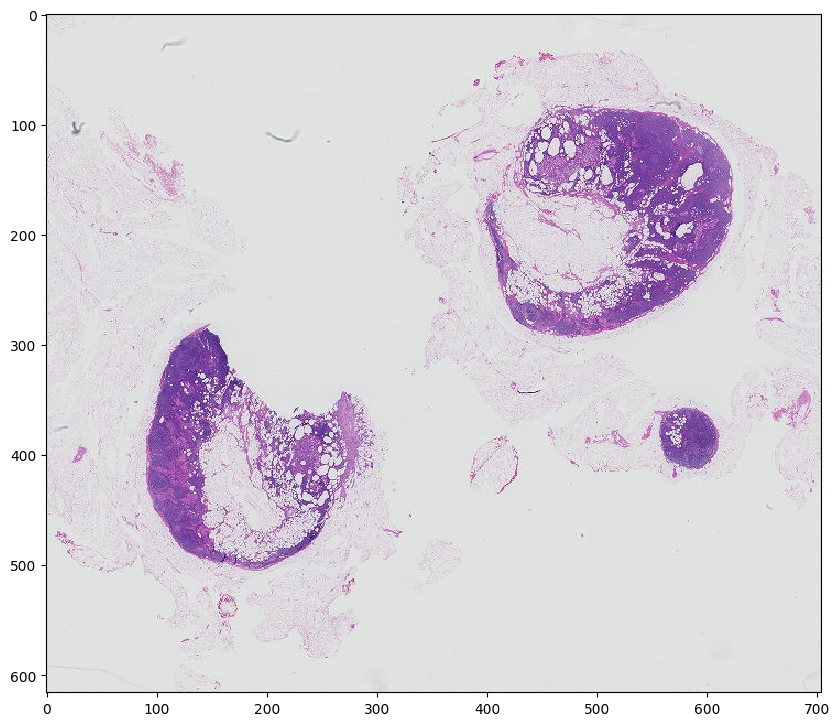

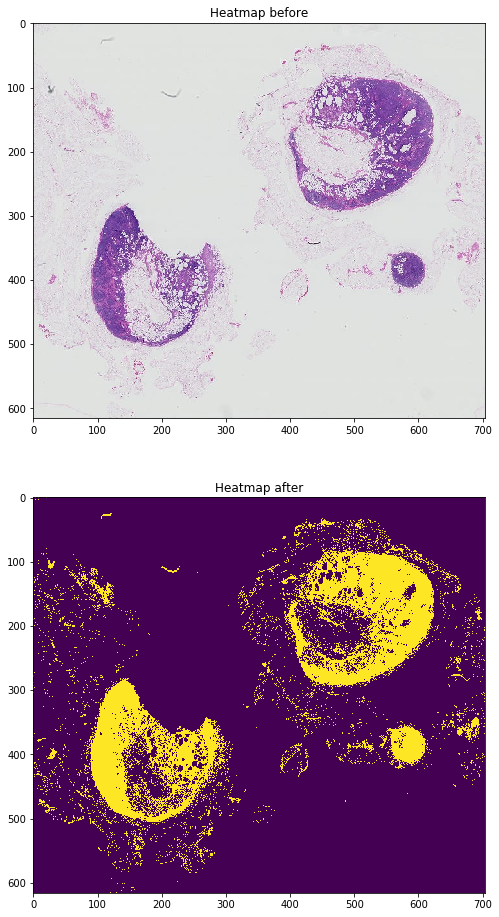

62713 tissue_pixels pixels (16.5 percent of the image)
(616, 704)


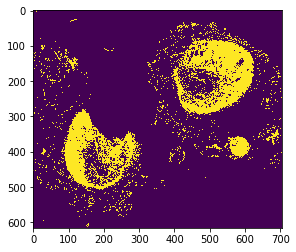

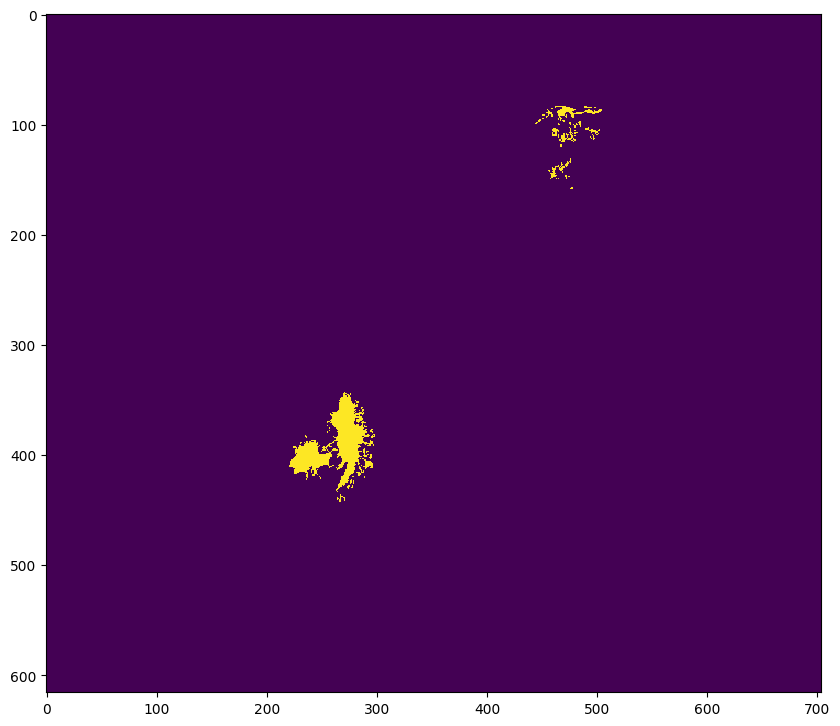

Successfully saved dt075 dir!
Successfully saved 075id_ma.npy file!
Saved zip file successfully!
successfully remove dt075 dir!
successfully remove tumor_075.tif file!
successfully remove tumor_075_mask.tif file!
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 1626M  100 1626M    0     0  80.3M      0  0:00:20  0:00:20 --:--:-- 92.4M
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 49.7M  100 49.7M    0     0  55.4M      0 --:--:-- --:--:-- --:--:-- 55.3M
Read WSI from tumor_078.tif with width: 94208, height: 111104
Read tumor mask from tumor_078_mask.tif
Slide includes 9 levels
Mask include 9 levels
Level 0, dimensions: (94208, 111104) downsample factor 1
Level 1, dimensions: (47104, 55552) downsample factor 2
Level 2, dimensions: (23552, 27776) downsample facto

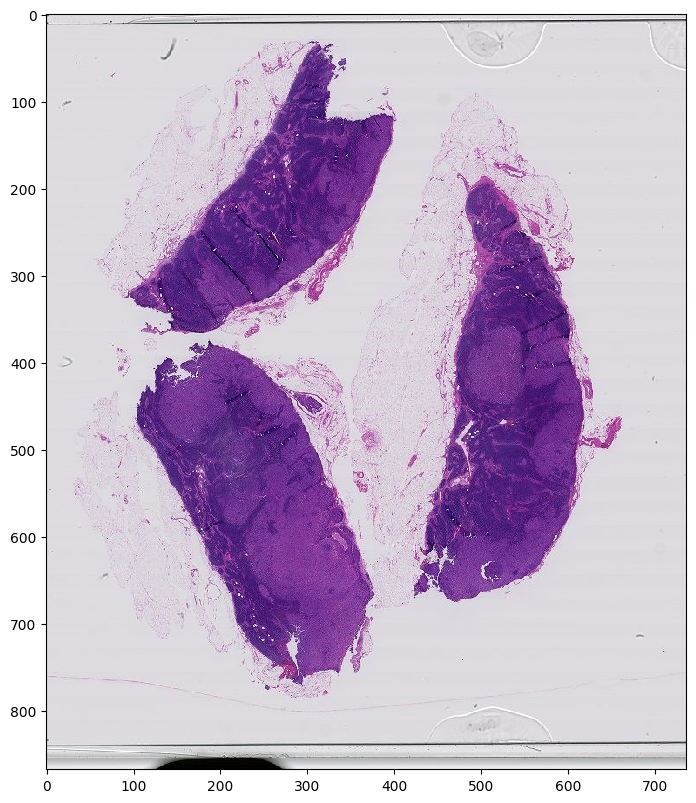

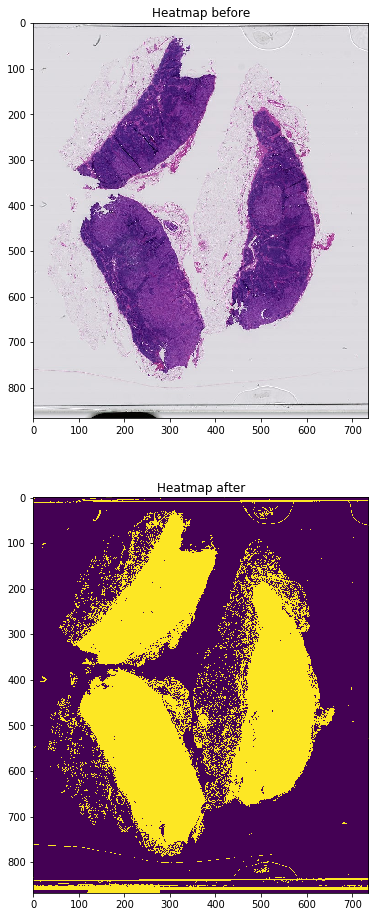

215836 tissue_pixels pixels (28.6 percent of the image)
(868, 736)


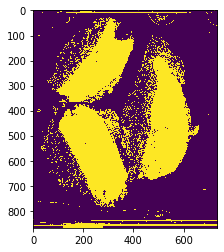

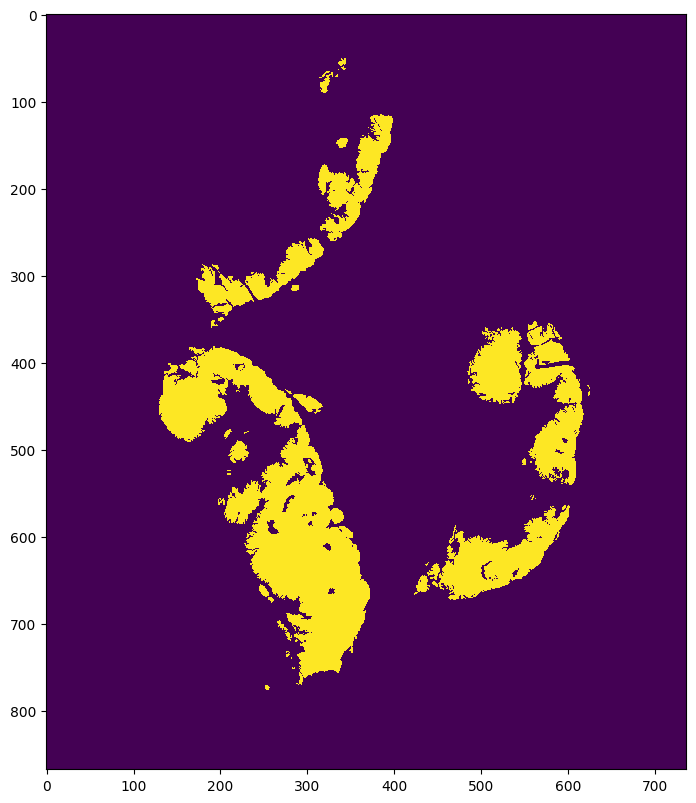

Successfully saved dt078 dir!
Successfully saved 078id_ma.npy file!
Saved zip file successfully!
successfully remove dt078 dir!
successfully remove tumor_078.tif file!
successfully remove tumor_078_mask.tif file!
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 1118M  100 1118M    0     0  48.4M      0  0:00:23  0:00:23 --:--:-- 89.1M
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 39.1M  100 39.1M    0     0  33.0M      0  0:00:01  0:00:01 --:--:-- 33.0M
Read WSI from tumor_081.tif with width: 90112, height: 100352
Read tumor mask from tumor_081_mask.tif
Slide includes 9 levels
Mask include 9 levels
Level 0, dimensions: (90112, 100352) downsample factor 1
Level 1, dimensions: (45056, 50176) downsample factor 2
Level 2, dimensions: (22528, 25088) downsample facto

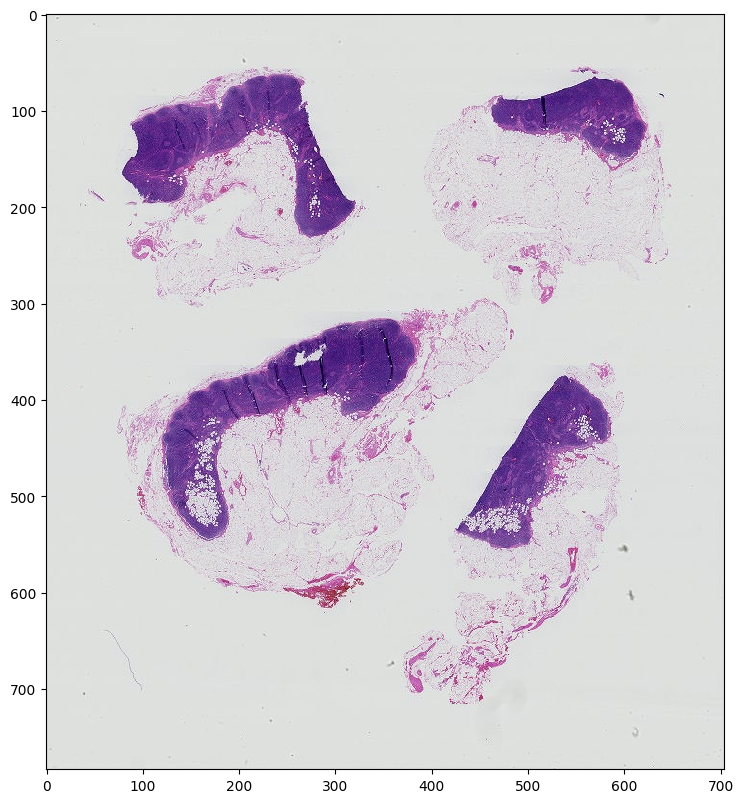

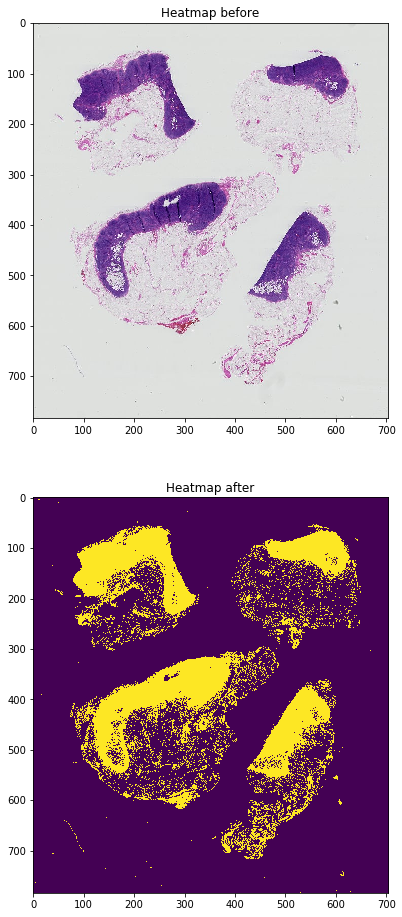

96469 tissue_pixels pixels (15.7 percent of the image)
(784, 704)


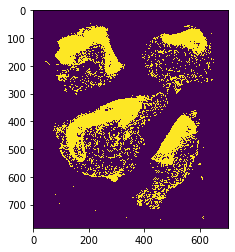

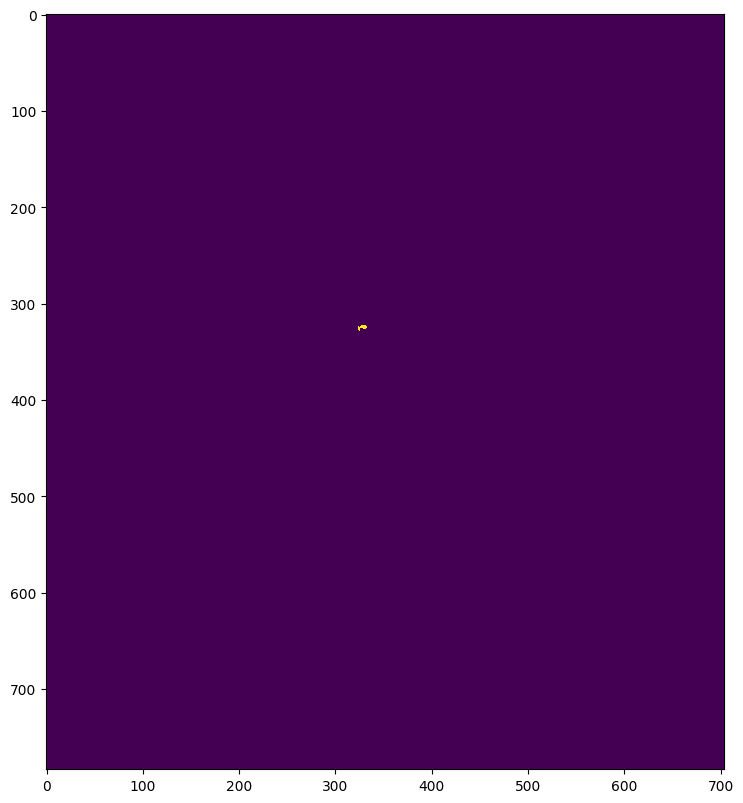

Successfully saved dt081 dir!
Successfully saved 081id_ma.npy file!
Saved zip file successfully!
successfully remove dt081 dir!
successfully remove tumor_081.tif file!
successfully remove tumor_081_mask.tif file!
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  799M  100  799M    0     0  61.9M      0  0:00:12  0:00:12 --:--:-- 82.8M
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 24.7M  100 24.7M    0     0  43.6M      0 --:--:-- --:--:-- --:--:-- 43.6M
Read WSI from tumor_084.tif with width: 65536, height: 86016
Read tumor mask from tumor_084_mask.tif
Slide includes 9 levels
Mask include 8 levels
Level 0, dimensions: (65536, 86016) downsample factor 1
Level 1, dimensions: (32768, 43008) downsample factor 2
Level 2, dimensions: (16384, 21504) downsample factor 

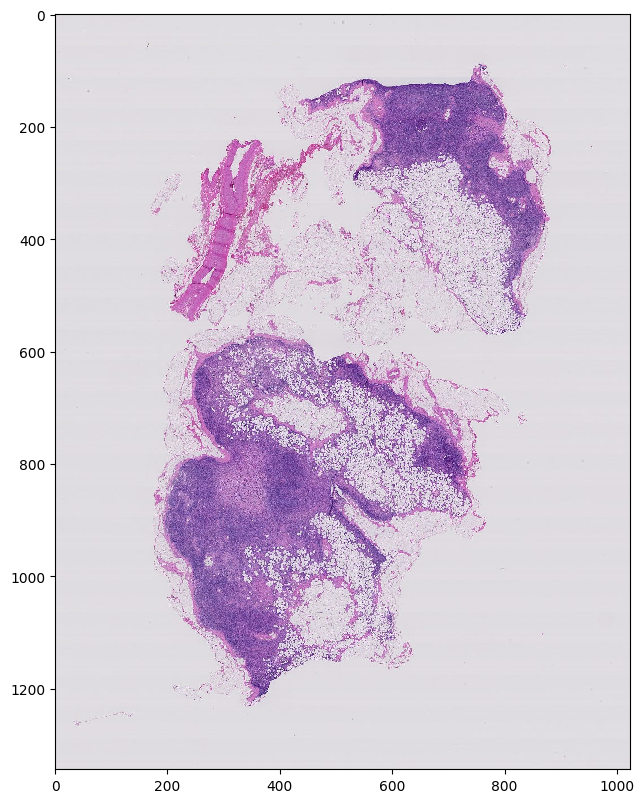

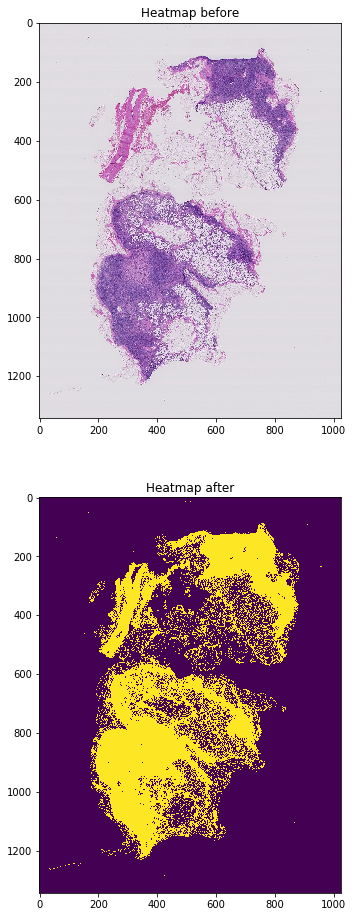

326873 tissue_pixels pixels (18.1 percent of the image)
(1344, 1024)


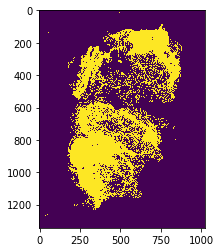

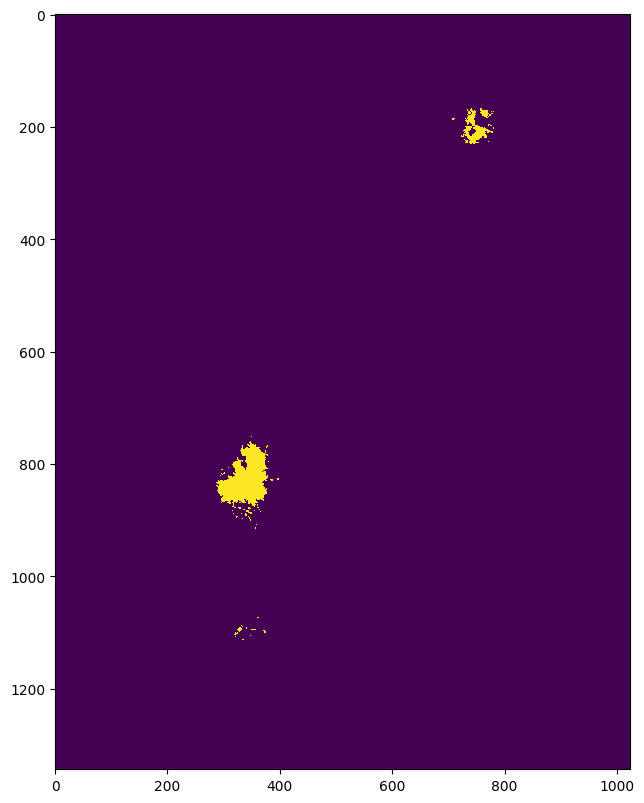

Successfully saved dt084 dir!
Successfully saved 084id_ma.npy file!
Saved zip file successfully!
successfully remove dt084 dir!
successfully remove tumor_084.tif file!
successfully remove tumor_084_mask.tif file!
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  521M  100  521M    0     0  60.4M      0  0:00:08  0:00:08 --:--:-- 64.8M
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 14.6M  100 14.6M    0     0  42.8M      0 --:--:-- --:--:-- --:--:-- 42.7M
Read WSI from tumor_091.tif with width: 61440, height: 53760
Read tumor mask from tumor_091_mask.tif
Slide includes 8 levels
Mask include 8 levels
Level 0, dimensions: (61440, 53760) downsample factor 1
Level 1, dimensions: (30720, 26880) downsample factor 2
Level 2, dimensions: (15360, 13440) downsample factor 

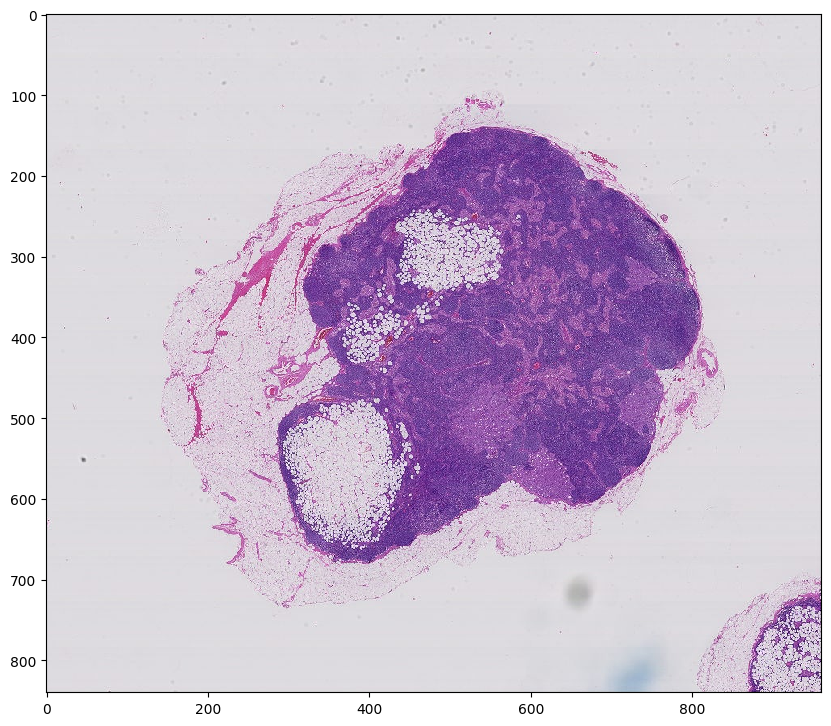

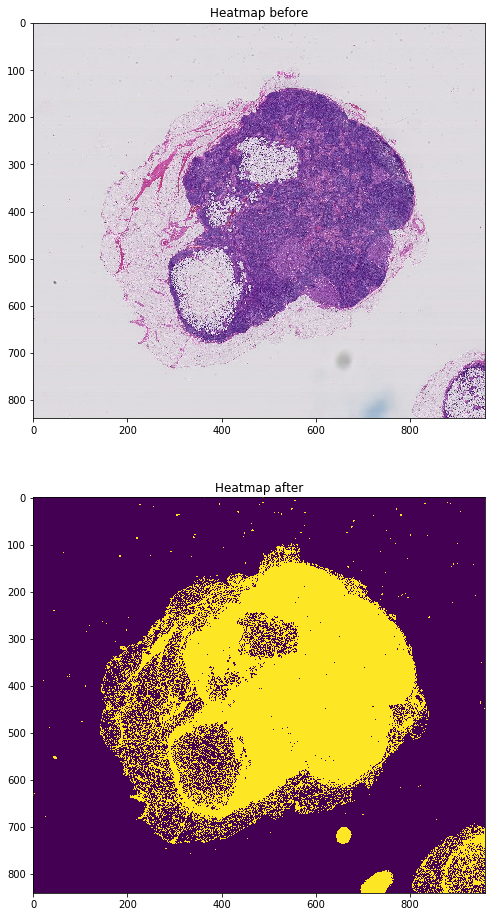

237731 tissue_pixels pixels (33.7 percent of the image)
(840, 960)


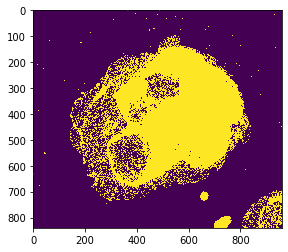

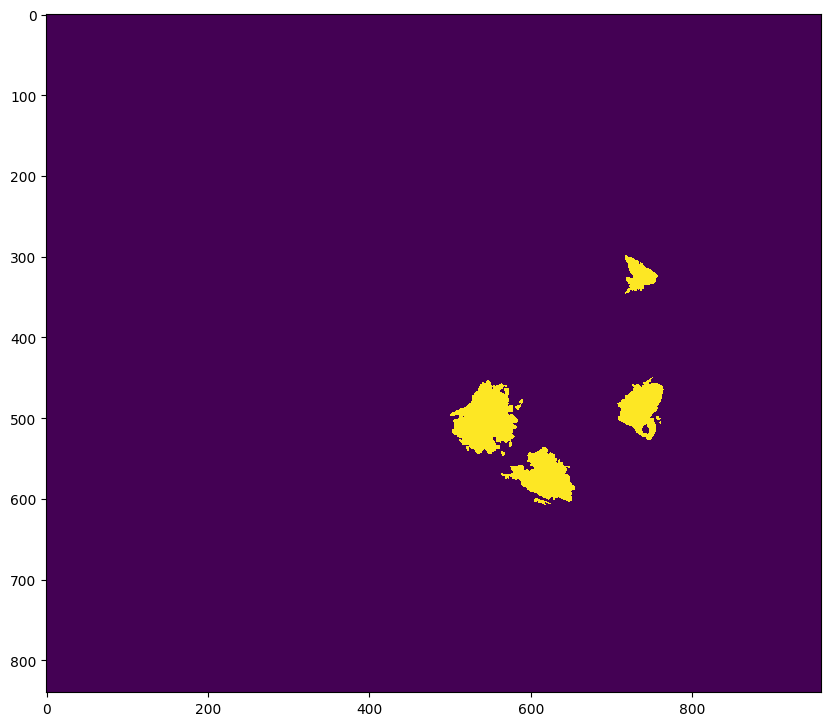

Successfully saved dt091 dir!
Successfully saved 091id_ma.npy file!
Saved zip file successfully!
successfully remove dt091 dir!
successfully remove tumor_091.tif file!
successfully remove tumor_091_mask.tif file!
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 1534M  100 1534M    0     0  66.9M      0  0:00:22  0:00:22 --:--:-- 66.8M
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 51.7M  100 51.7M    0     0  67.9M      0 --:--:-- --:--:-- --:--:-- 68.0M
Read WSI from tumor_094.tif with width: 118784, height: 100352
Read tumor mask from tumor_094_mask.tif
Slide includes 9 levels
Mask include 9 levels
Level 0, dimensions: (118784, 100352) downsample factor 1
Level 1, dimensions: (59392, 50176) downsample factor 2
Level 2, dimensions: (29696, 25088) downsample fac

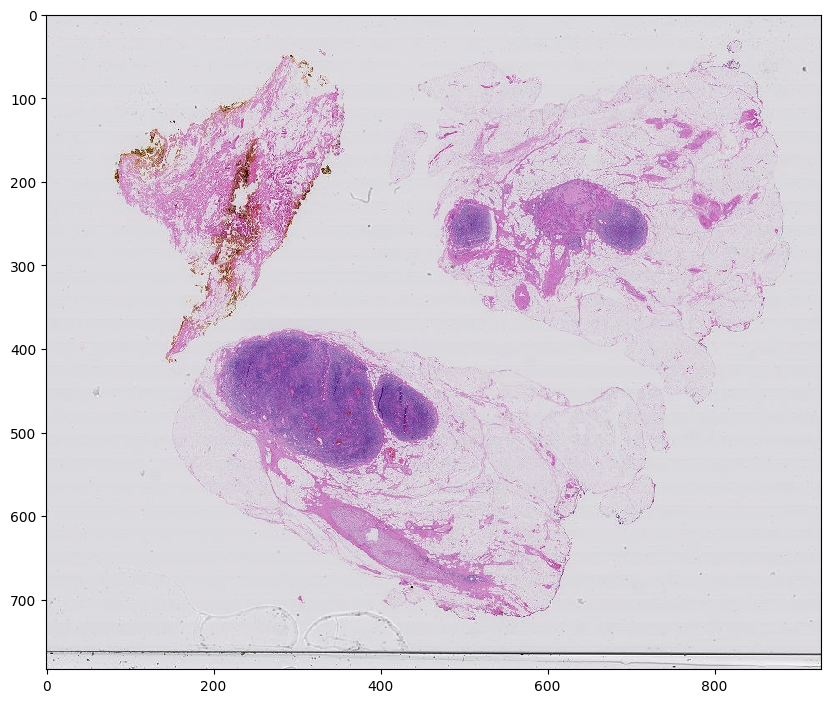

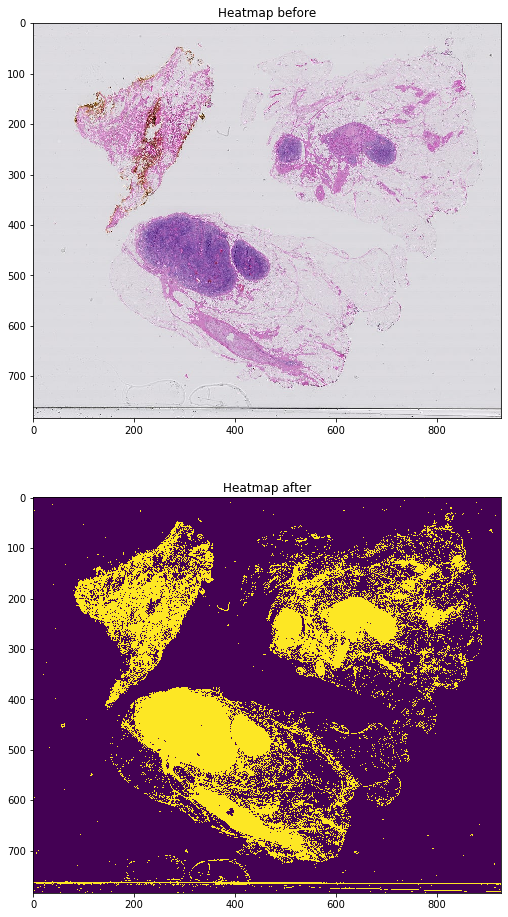

155404 tissue_pixels pixels (25.3 percent of the image)
(784, 928)


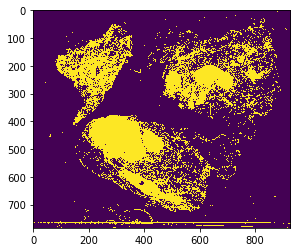

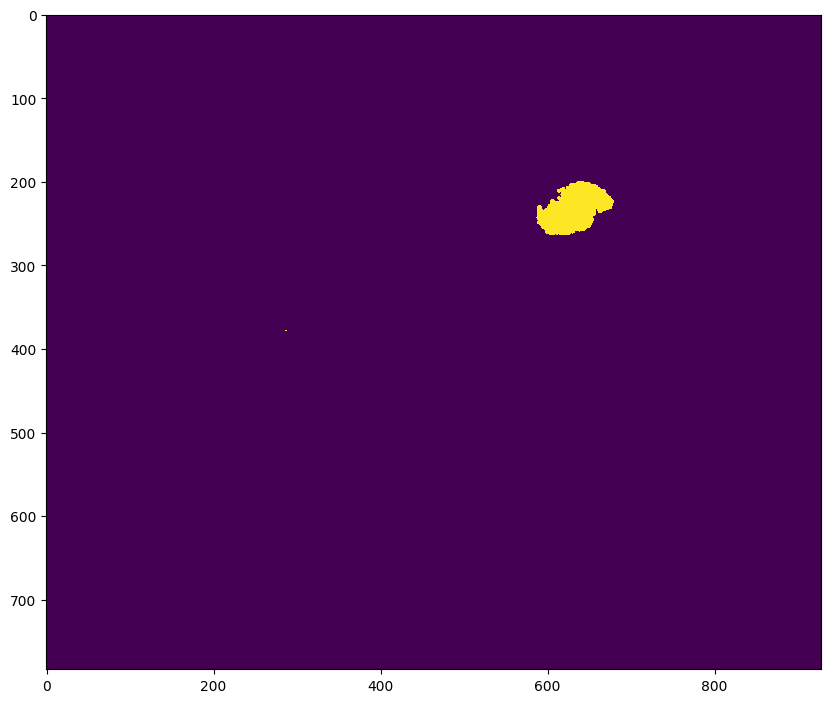

Successfully saved dt094 dir!
Successfully saved 094id_ma.npy file!
Saved zip file successfully!
successfully remove dt094 dir!
successfully remove tumor_094.tif file!
successfully remove tumor_094_mask.tif file!
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 1260M  100 1260M    0     0  93.3M      0  0:00:13  0:00:13 --:--:-- 96.3M
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 41.2M  100 41.2M    0     0  56.3M      0 --:--:-- --:--:-- --:--:-- 56.2M
Read WSI from tumor_096.tif with width: 131072, height: 71680
Read tumor mask from tumor_096_mask.tif
Slide includes 9 levels
Mask include 9 levels
Level 0, dimensions: (131072, 71680) downsample factor 1
Level 1, dimensions: (65536, 35840) downsample factor 2
Level 2, dimensions: (32768, 17920) downsample facto

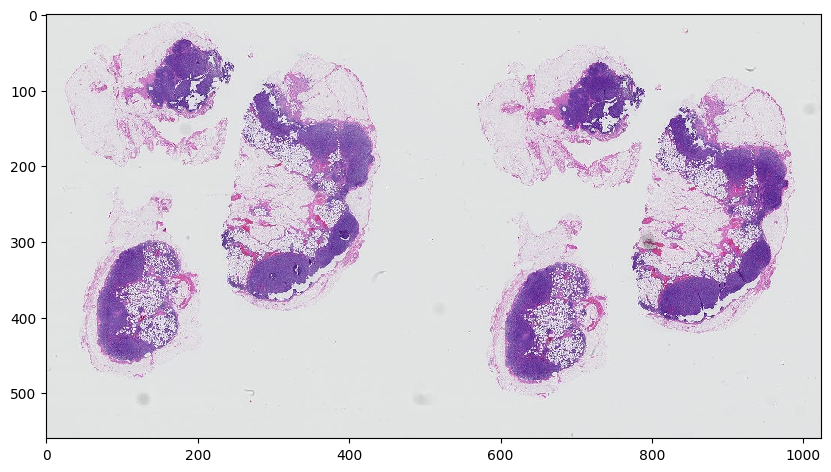

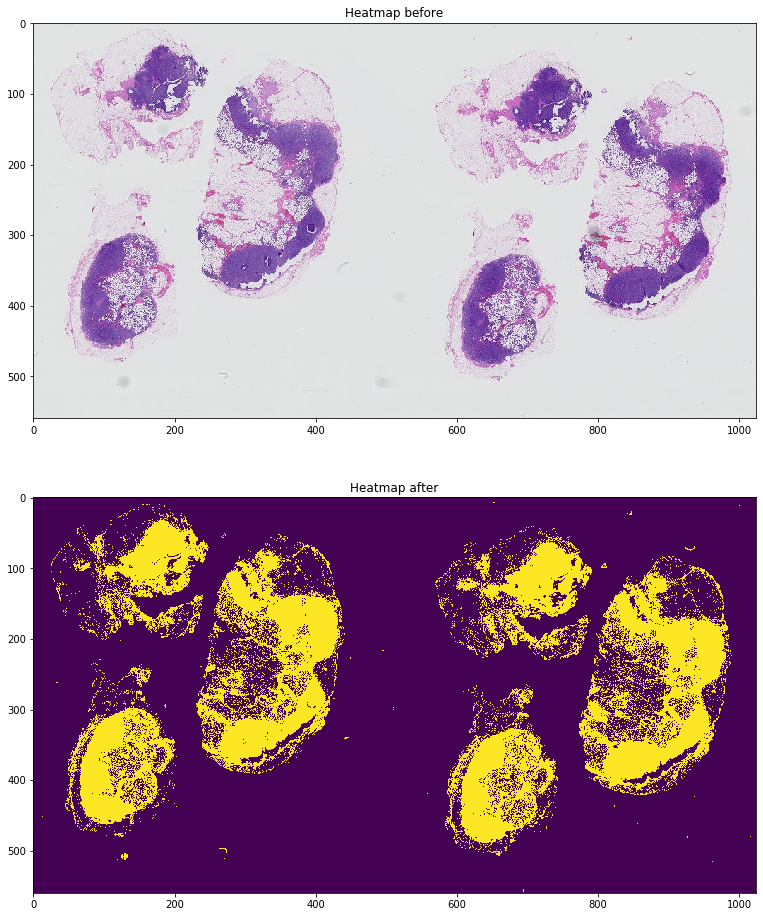

120038 tissue_pixels pixels (38.3 percent of the image)
(560, 1024)


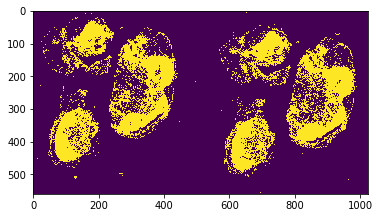

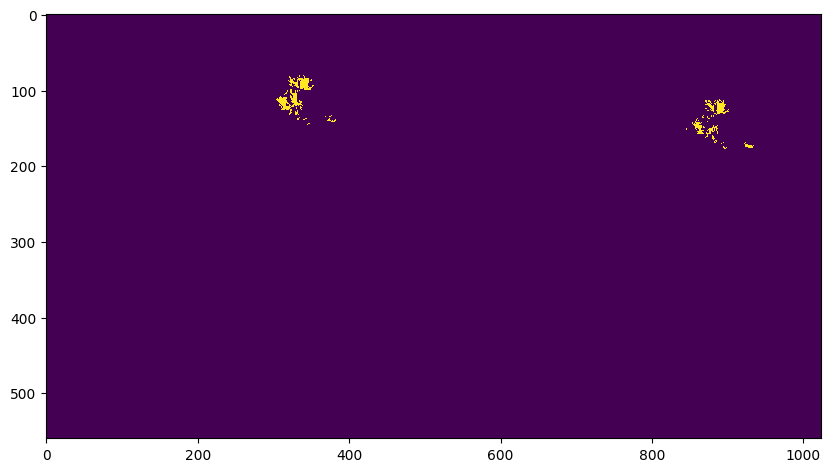

Successfully saved dt096 dir!
Successfully saved 096id_ma.npy file!
Saved zip file successfully!
successfully remove dt096 dir!
successfully remove tumor_096.tif file!
successfully remove tumor_096_mask.tif file!
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 1392M  100 1392M    0     0  81.5M      0  0:00:17  0:00:17 --:--:-- 67.0M
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 43.9M  100 43.9M    0     0  31.5M      0  0:00:01  0:00:01 --:--:-- 31.5M
Read WSI from tumor_101.tif with width: 139264, height: 71680
Read tumor mask from tumor_101_mask.tif
Slide includes 10 levels
Mask include 9 levels
Level 0, dimensions: (139264, 71680) downsample factor 1
Level 1, dimensions: (69632, 35840) downsample factor 2
Level 2, dimensions: (34816, 17920) downsample fact

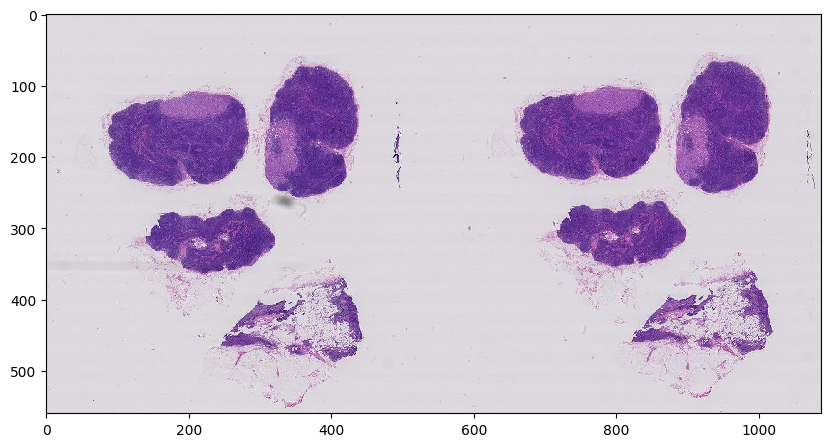

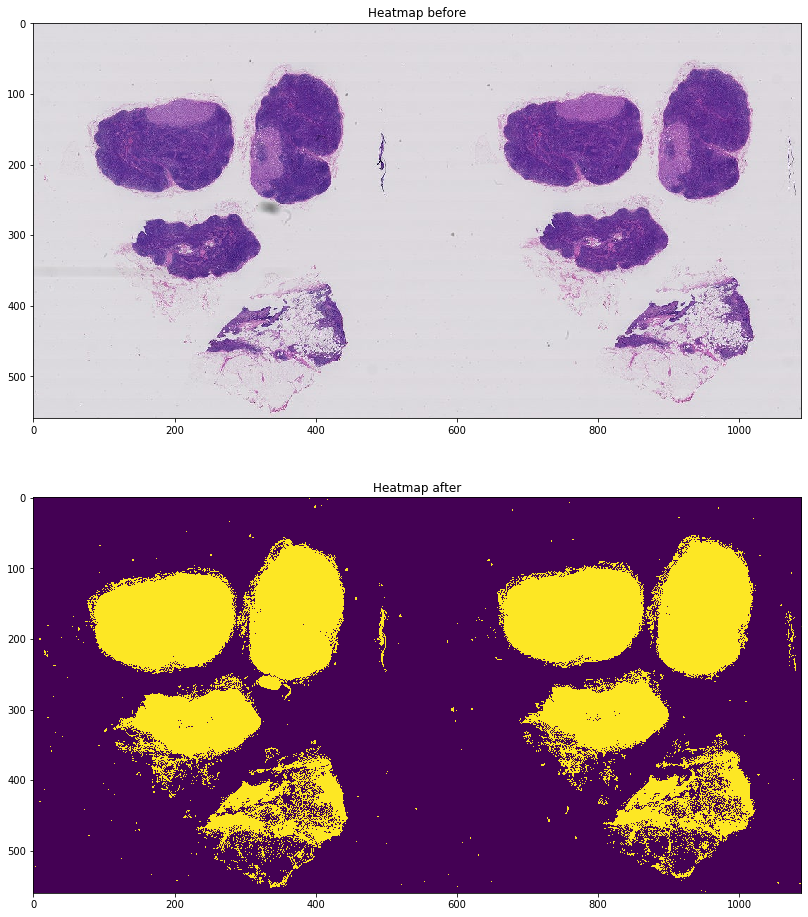

150818 tissue_pixels pixels (48.1 percent of the image)
(560, 1088)


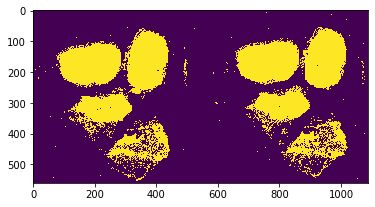

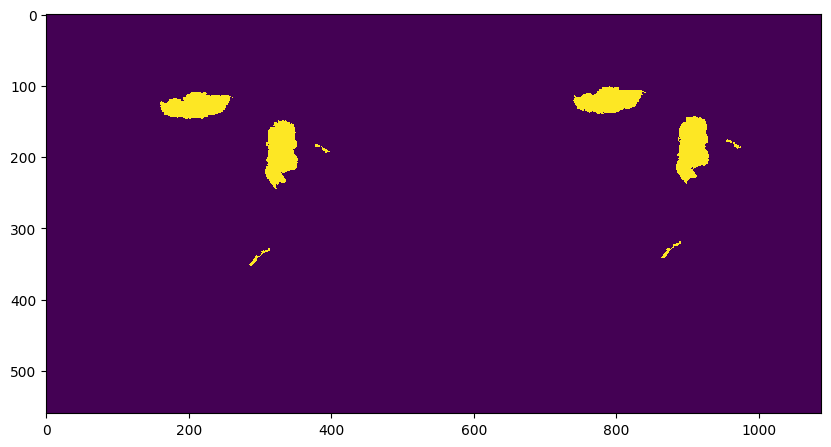

Successfully saved dt101 dir!
Successfully saved 101id_ma.npy file!
Saved zip file successfully!
successfully remove dt101 dir!
successfully remove tumor_101.tif file!
successfully remove tumor_101_mask.tif file!
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 1416M  100 1416M    0     0  71.6M      0  0:00:19  0:00:19 --:--:-- 95.2M
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 31.3M  100 31.3M    0     0  57.9M      0 --:--:-- --:--:-- --:--:-- 57.9M
Read WSI from tumor_110.tif with width: 94208, height: 71680
Read tumor mask from tumor_110_mask.tif
Slide includes 9 levels
Mask include 9 levels
Level 0, dimensions: (94208, 71680) downsample factor 1
Level 1, dimensions: (47104, 35840) downsample factor 2
Level 2, dimensions: (23552, 17920) downsample factor 

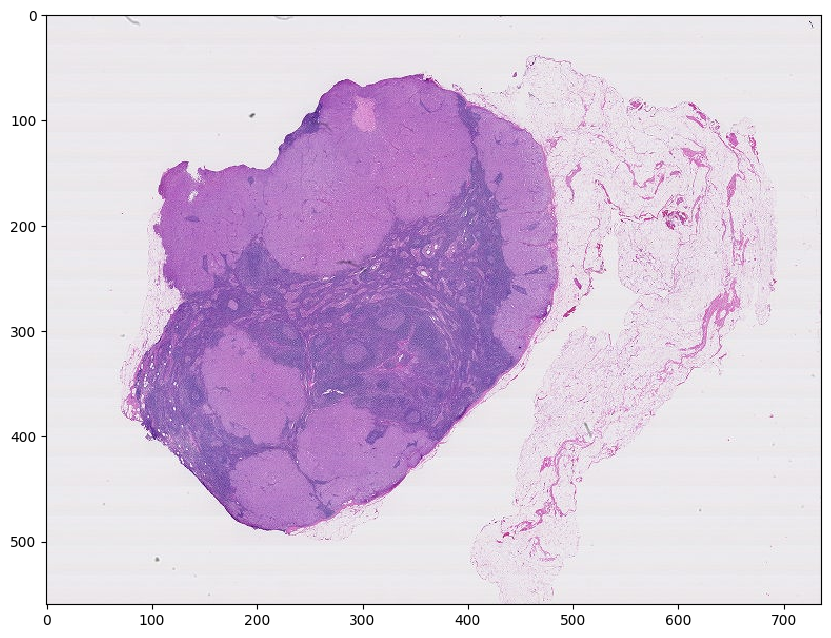

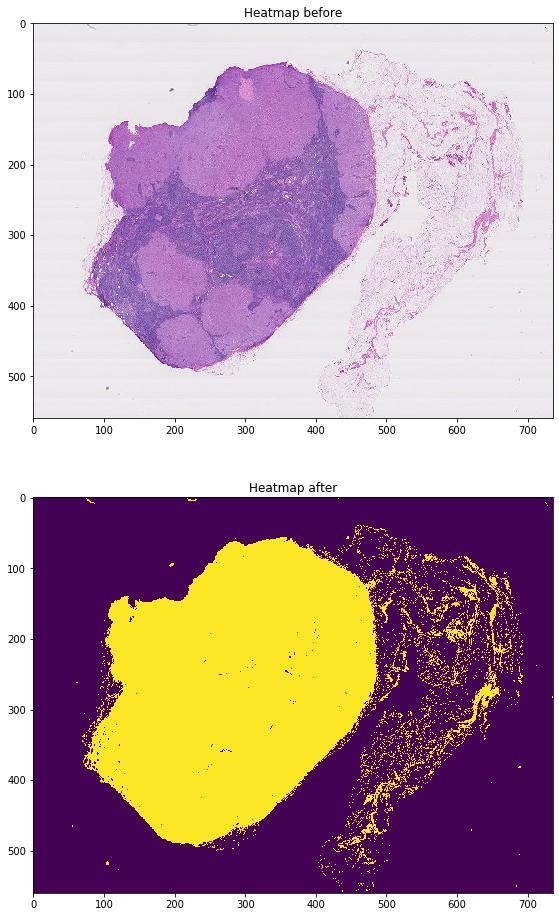

137357 tissue_pixels pixels (43.8 percent of the image)
(560, 736)


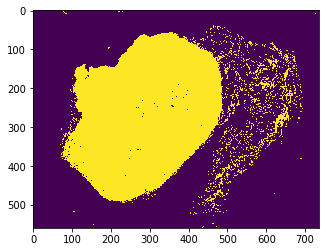

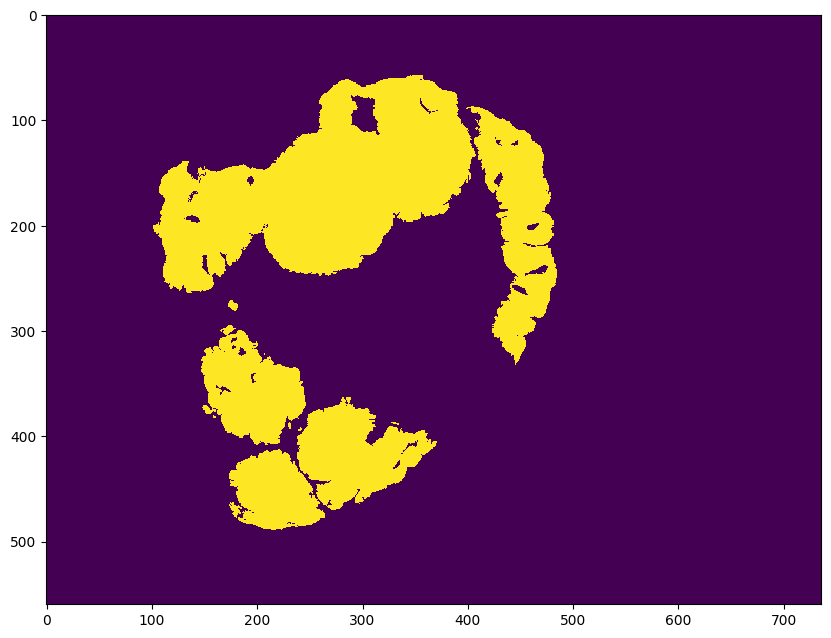

Successfully saved dt110 dir!
Successfully saved 110id_ma.npy file!
Saved zip file successfully!
successfully remove dt110 dir!
successfully remove tumor_110.tif file!
successfully remove tumor_110_mask.tif file!


In [0]:
import shutil


for im_name in index_list:

  
  slide_path = 'tumor_'+ im_name +'.tif' # only this file is available
  tumor_mask_path = 'tumor_'+ im_name +'_mask.tif' # only this file is available


  slide_url = "https://storage.googleapis.com/dl4cv1445/ADL/tumor_"+ im_name +".tif"
  mask_url = "https://storage.googleapis.com/dl4cv1445/ADL/tumor_" + im_name + "_mask.tif"

  # Download the whole slide image
  if not os.path.exists(slide_path):
    !curl -O $slide_url

  # Download the tumor mask
  if not os.path.exists(tumor_mask_path):
    !curl -O $mask_url
  
  # print('Loaded slides successfully!')

  ### Look at the slides dimension ###

  idx = 0

  slide_path = 'tumor_'+ im_name +'.tif' # only this file is available
  tumor_mask_path = 'tumor_'+ im_name +'_mask.tif' # only this file is available

  slide = open_slide(slide_path)
  print ("Read WSI from %s with width: %d, height: %d" % (slide_path, 
                                                          slide.level_dimensions[0][0], 
                                                          slide.level_dimensions[0][1]))

  tumor_mask = open_slide(tumor_mask_path)
  print ("Read tumor mask from %s" % (tumor_mask_path))

  print("Slide includes %d levels" % len(slide.level_dimensions))
  print("Mask include %d levels" % len(tumor_mask.level_dimensions))

  max_level = min(len(slide.level_dimensions), len(tumor_mask.level_dimensions)) - 1
  for i in range(max_level+1):
      print("Level %d, dimensions: %s downsample factor %d" % (i, 
                                                              slide.level_dimensions[i], 
                                                              slide.level_downsamples[i]))
      assert tumor_mask.level_dimensions[i][0] == slide.level_dimensions[i][0]
      assert tumor_mask.level_dimensions[i][1] == slide.level_dimensions[i][1]

  # slide.level_downsamples[i]: downsample factor 
  # slide.level_dimensions[i]: demension after downsample
  # Verify downsampling works as expected

  width, height = slide.level_dimensions[max_level]
  assert width * slide.level_downsamples[max_level] == slide.level_dimensions[0][0]
  assert height * slide.level_downsamples[max_level] == slide.level_dimensions[0][1]


  ## Take a look at the iamges and masks

  HEIGHT = 128
  WIDTH = 128
  level = max_level-1

  slide_image = read_slide(slide, 
                          x=0, 
                          y=0, 
                          level=level, 
                          width=slide.level_dimensions[level][0], 
                          height=slide.level_dimensions[level][1])

  print(slide_image.shape)
  plt.figure(figsize=(10,10), dpi=100)
  plt.imshow(slide_image)

  tissue_pixels= find_tissue_pixels(slide_image)
  percent_tissue = len(tissue_pixels) / float(slide_image.shape[0] * slide_image.shape[0]) * 100
  print ("%d tissue_pixels pixels (%.1f percent of the image)" % (len(tissue_pixels), percent_tissue))

  im_gray = rgb2gray(slide_image)
  plt.imshow(im_gray<0.8)
  


  mask_image = read_slide(tumor_mask, 
                        x=0, 
                        y=0, 
                        level=level, 
                        width=tumor_mask.level_dimensions[level][0], 
                        height=tumor_mask.level_dimensions[level][1])
  mask_image = mask_image[:,:,0]  
  print(mask_image.shape)
  plt.figure(figsize=(10,10), dpi=100)
  plt.imshow(mask_image, vmin=0.0, vmax=1.0)
  plt.show()


  if not os.path.exists("dt"+im_name):
    os.mkdir("dt"+im_name)


  ### Begin extract data ###
  import cv2
  WIDTH = 128
  HEIGHT = 128

  max_width = slide.level_dimensions[0][0]
  max_height = slide.level_dimensions[0][1]

  
  d1 = slide.level_dimensions[ll][0] # width
  d2 = slide.level_dimensions[ll][1] # height

  mm = np.ceil(d2/128).astype('int') # num of sliding windows in height
  nn = np.ceil(d1/128).astype('int') # num of sliding windows in width


  # fig, axes = plt.subplots(mm, nn, figsize=(nn//2,mm//2))
  id_im = []
  id_ma = []
  dd = int(slide.level_downsamples[ll])
  jump = []

  kk_im = 0
  kk_ma = 0

  xx = 0
  yy = 0

  #i height
  for i in range(mm):
    # j width
    for j in range(nn):
      if (i+1)*HEIGHT <= d2 and (j+1)*WIDTH <= d1:
        slide_image = read_slide(slide, 
                                x=xx*dd + j*dd*WIDTH, 
                                y=yy*dd + i*dd*HEIGHT, 
                                level=ll, 
                                width=WIDTH, 
                                height=HEIGHT)
        mask_img = read_slide(tumor_mask, 
                            x=xx*dd + j*dd*WIDTH, 
                            y=yy*dd + i*dd*HEIGHT, 
                            level=ll, 
                            width=WIDTH, 
                            height=HEIGHT)
        mask_img = mask_img[:,:,0] 
        
      
      elif (i+1)*HEIGHT <= d2 and (j+1)*WIDTH > d1:
        slide_image = read_slide(slide, 
                              x=max_width-WIDTH*dd, 
                              y=yy*dd + i*dd*HEIGHT, 
                              level=ll, 
                              width=WIDTH, 
                              height=HEIGHT)
        mask_img = read_slide(tumor_mask, 
                            x=max_width-WIDTH*dd, 
                            y=yy*dd + i*dd*HEIGHT, 
                            level=ll, 
                            width=WIDTH, 
                            height=HEIGHT)
        mask_img = mask_img[:,:,0]  

        
        
      elif (i+1)*HEIGHT > d2 and (j+1)*WIDTH <= d1:
        slide_image = read_slide(slide, 
                              x=xx*dd + j*dd*WIDTH,
                              y=max_height-HEIGHT*dd, 
                              level=ll, 
                              width=WIDTH, 
                              height=HEIGHT)
        mask_img = read_slide(tumor_mask, 
                            x=xx*dd + j*dd*WIDTH,
                            y=max_height-HEIGHT*dd, 
                            level=ll, 
                            width=WIDTH, 
                            height=HEIGHT)
        mask_img = mask_img[:,:,0]
        
        
        
        
      elif (i+1)*HEIGHT > d2 and (j+1)*WIDTH > d1:
        slide_image = read_slide(slide, 
                              x=max_width-WIDTH*dd, 
                              y=max_height-HEIGHT*dd, 
                              level=ll, 
                              width=WIDTH, 
                              height=HEIGHT)
        mask_img = read_slide(tumor_mask, 
                            x=max_width-WIDTH*dd, 
                            y=max_height-HEIGHT*dd, 
                            level=ll, 
                            width=WIDTH, 
                            height=HEIGHT)
        mask_img = mask_img[:,:,0]
      

      # axes[i][j].imshow(slide_image)
      # axes[i][j].axis('off')

      # axes[i][j].imshow(mask_img, vmin=0, vmax=1, cmap='jet', alpha=0.5)

      # cv2.imwrite("dt/" + im_name+ "_%d_%d.jpg" % (i, j), slide_image)
      # cv2.imwrite("dt/" + im_name+ "_%d_%d_mask.jpg" % (i, j), mask_img)

      if find_tissue_pixels1(slide_image):
        if find_cancer_pixels(mask_img):
          kk_ma = kk_ma + 1
          id_ma.append(str(i) + '_' + str(j))
        else:
          kk_im = kk_im + 1
          id_im.append(str(i) + '_' + str(j))
        # print(i, j)
        mask_img = mask_img * 255.0
        cv2.imwrite("dt"+im_name+"/" + im_name+ "_%d_%d.jpg" % (i, j), slide_image)
        cv2.imwrite("dt"+im_name+"/" + im_name+ "_%d_%d_mask.jpg" % (i, j), mask_img)
        
      else:
        jump.append(str(i) + '_' + str(j))
        continue
      

      
  print("Successfully saved "+"dt"+im_name+" dir!")
  # plt.tight_layout()
  # plt.show()
  filename = im_name+ "id_im"+'.npy'
  np.save(filename, id_im)
  filename = im_name+ "id_ma"+'.npy'
  np.save(filename, id_ma)
  print("Successfully saved "+filename+" file!")

  
  shutil.make_archive('dt'+im_name, 'zip', 'dt'+im_name)
  print("Saved zip file successfully!")

  shutil.rmtree('dt'+im_name, ignore_errors=True)
  print("successfully remove "+'dt'+im_name+" dir!")
  os.remove('tumor_'+ im_name +'.tif')
  print("successfully remove "+ 'tumor_'+ im_name +'.tif'+" file!")
  os.remove('tumor_'+ im_name +'_mask.tif')
  print("successfully remove "+ 'tumor_'+ im_name +'_mask.tif' +" file!")

